In [89]:
import os
import sys
from pathlib import Path

import anndata as ad
import h5py
import matplotlib.pyplot as plt
import numpy as np

import pandas as pd
import scanpy as sc
import seaborn as sns
from joblib import Parallel, delayed
from matplotlib.pyplot import rc_context
from skimage import exposure, io
from skimage.util import img_as_ubyte
from sklearn.preprocessing import MinMaxScaler, StandardScaler
from tqdm.notebook import tqdm, trange
from matplotlib.patches import Patch

sc.settings.verbosity = 3

In [90]:
p_dir = (Path().cwd().parents[0]).absolute()
data_dir = p_dir / "data"

In [91]:
%load_ext autoreload
%autoreload 2

module_path = str(p_dir / "src")

if module_path not in sys.path:
    sys.path.append(module_path)

import scanorama


The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [92]:
experiment = "tonsil"
cores = ["DonorA", "DonorE"]
datasets = [core + f"_{i}" for core in cores for i in range(1, 7)]

# Load data

In [93]:
import palettable
heatmap_cmp = palettable.cmocean.diverging.Balance_20.mpl_colormap


In [94]:
def read_props(dataset, experiment):
    df_morph = pd.read_csv(data_dir / "props" / f"morphology_IMC_{experiment}_{dataset}.csv")
    df_intensity_IMC = pd.read_csv(data_dir / "props" / f"intensity_IMC_{experiment}_{dataset}.csv")
    df_intensity_TS = pd.read_csv(data_dir / "props" / f"intensity_TS_{experiment}_{dataset}_auto.csv")

    return df_morph, df_intensity_IMC, df_intensity_TS

In [95]:
%%capture 

adatas = []
adatas_raw = []
df_sums = []
for dataset in datasets:
    try:
        df_morph, df_intensity_IMC, df_intensity_TS = read_props(dataset, experiment)
        print(f'Sucessfully read dataset {dataset}') 
    except:
        print(f'{dataset} cannot be read') 
        continue
    try:
        df_intensity_TS.drop(['Rest', 'Total'], axis=1, inplace=True)
    except:
        pass
    df_intensity_TS.iloc[:, 1:] = df_intensity_TS.iloc[:, 1:].multiply(
        df_morph["area"], axis=0
    )
    # data_all = df_intensity_TS.iloc[:, 1:].values
    # data_all_norm = (data_all+0.1)/(np.percentile(data_all,50,axis=1,keepdims=True)+0.1)
    # data_all_norm = MinMaxScaler().fit_transform(data_all)
    # df_intensity_TS.iloc[:, 1:] = data_all_norm
    
    # Merge TS and IMC data
    df = df_intensity_TS
    df.set_index("Id", inplace=True)
    df_sums.append(df.sum(axis=0))
    
    # Put to adata format
    adata = sc.AnnData(df.values)
    adata.var_names = df.columns.tolist()
    adata.obs["Cell"] = df.index.tolist()
    adata.obs["Dataset"] = dataset
    adata.obs["Core"] = dataset.split("_")[0]
    adata.obsm["spatial"] = df_morph[["centroid-0", "centroid-1"]].to_numpy()
    
    # FPM normalize
    sc.pp.normalize_total(adata, target_sum=1e5)
    # sc.pp.log1p(adata, base=2)
    adatas_raw.append(adata.copy())
    
    # Standard scale
    sc.pp.scale(adata)
    adatas.append(adata)
    
adata = ad.concat(adatas, join="inner")
adata_raw = ad.concat(adatas_raw, join="inner")

normalizing counts per cell
    finished (0:00:00)
normalizing counts per cell
    finished (0:00:00)
normalizing counts per cell
    finished (0:00:00)
normalizing counts per cell
    finished (0:00:00)
normalizing counts per cell
    finished (0:00:00)
normalizing counts per cell
    finished (0:00:00)
normalizing counts per cell
    finished (0:00:00)
normalizing counts per cell
    finished (0:00:00)
normalizing counts per cell
    finished (0:00:00)
normalizing counts per cell
    finished (0:00:00)
normalizing counts per cell
    finished (0:00:00)


... storing 'Dataset' as categorical
... storing 'Core' as categorical


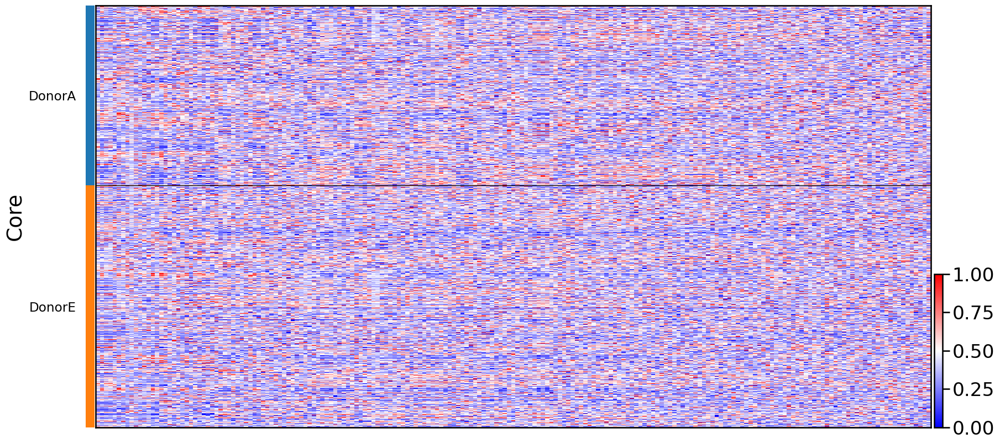

In [96]:
sc.pl.heatmap(adata, adata.var_names, groupby='Core', swap_axes=False, cmap='bwr', figsize=(20,10), standard_scale='obs', use_raw=False)

In [97]:
# Read Protein clustering info
path = data_dir / "adata" / f"{experiment}_GC_1017.h5ad"
adata_IMC_cluster = ad.read_h5ad(path)


C:\Users\thu71\Anaconda3\envs\athena\lib\site-packages\anndata\_core\anndata.py:1830: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")


In [98]:
adata_IMC_cluster 

AnnData object with n_obs × n_vars = 31156 × 12
    obs: 'Cell', 'Dataset', 'Core', 'leiden', 'Region_GC', 'Type'
    uns: 'Core_colors', 'Dataset_colors', 'Region_GC_colors', 'Type_colors', 'dendrogram_leiden', 'leiden', 'leiden_colors', 'neighbors', 'umap'
    obsm: 'X_scanorama', 'X_umap', 'spatial'
    obsp: 'connectivities', 'distances'

In [99]:
adata = adata[~adata.obs.Dataset.isin(['F7_1', 'F7_2'])]
adata_IMC = adata_IMC_cluster[~adata_IMC_cluster.obs.Dataset.isin(['F7_1', 'F7_2'])]

In [100]:
df_sum = pd.concat(df_sums, axis=1).mean(axis=1)
mz_qc = df_sum[(df_sum > 7000)].index.tolist()

In [101]:
len(mz_qc)

185

In [102]:
adata = adata[:, mz_qc]
adata_raw = adata_raw[:, mz_qc]

## Get literature lut

In [103]:
SIMS_masses = adata.var_names

In [104]:
# Read litterature lut
file_path = data_dir / "metadata" / 'Putative_annotation_09012022.xlsx'
df = pd.read_excel(file_path)
lum = df['m/z'].to_numpy()

# get matched table by looking at difference with error
error = 0.4
matched_dfs = []
for mz in SIMS_masses.astype(float):
    if mz < 1.1:
        continue
    diff = lum-mz
    matched = df[abs(diff)<error]
    if len(matched) > 0:
        matched.loc[:,'SIMS mz'] = mz
        matched_dfs.append(matched)
    else:
        matched = pd.DataFrame([['', '', '', '', mz]], columns=df.columns.tolist() + ['SIMS mz'])
        matched_dfs.append(matched)
matched = pd.concat(matched_dfs)

C:\Users\thu71\AppData\Local\Temp\ipykernel_34460\1921335408.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  matched.loc[:,'SIMS mz'] = mz
C:\Users\thu71\AppData\Local\Temp\ipykernel_34460\1921335408.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  matched.loc[:,'SIMS mz'] = mz
C:\Users\thu71\AppData\Local\Temp\ipykernel_34460\1921335408.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the

In [105]:
# Get all info from litterature excel
SIMS_masses_subset = np.array(matched['SIMS mz'].to_list(), dtype=float).astype(str)
SIMS_masses_subset = pd.Index(SIMS_masses_subset)

matched.loc[matched['Molecules'] != '', 'Molecules'] = ' ' + matched.loc[matched['Molecules'] != '', 'Molecules']
SIMS_name_subset = np.array(matched['Molecules'].to_list()).astype(str)
SIMS_name_subset = pd.Index(SIMS_name_subset)
SIMS_name_subset = SIMS_name_subset

SIMS_nm_subset = SIMS_masses_subset + 'm/z' + SIMS_name_subset 

SIMS_type_subset = np.array(matched['Type'].to_list()).astype(str)
SIMS_type_subset = pd.Index(SIMS_type_subset)

print(f"Number of matched m/z: {len(SIMS_masses_subset)}")

Number of matched m/z: 184


In [106]:
adata_all = adata.copy()
adata = adata[:, SIMS_masses_subset]
adata.var_names = SIMS_nm_subset

C:\Users\thu71\Anaconda3\envs\athena\lib\site-packages\anndata\_core\anndata.py:1830: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")


In [107]:
adata_raw = adata_raw[:, SIMS_masses_subset]
adata_raw.var_names = SIMS_nm_subset


# Germinal center analysis

    using data matrix X directly
Storing dendrogram info using `.uns['dendrogram_Type']`


C:\Users\thu71\Anaconda3\envs\athena\lib\site-packages\scanpy\tools\_dendrogram.py:161: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[key_added] = dat
C:\Users\thu71\Anaconda3\envs\athena\lib\site-packages\anndata\_core\anndata.py:1830: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")


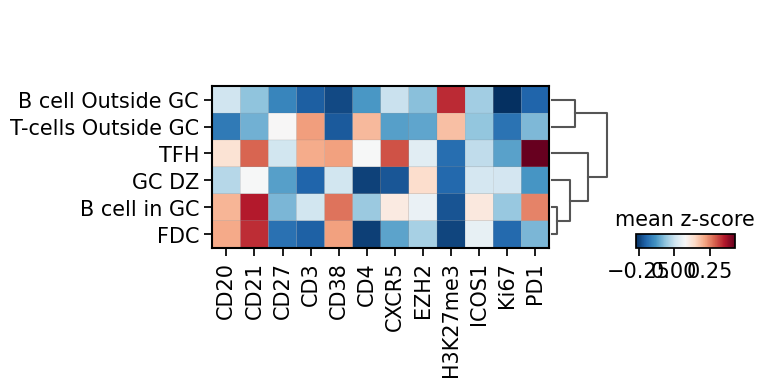

In [108]:
sc.tl.dendrogram(adata_IMC, groupby='Type')
sns.set_context("notebook", font_scale=1.5)
sc.pl.matrixplot(
    adata_IMC,
    adata_IMC.var_names.tolist(),
    "Type",
    dendrogram=True,
    colorbar_title="mean z-score",
    cmap="RdBu_r",
    swap_axes=False,
)

    using data matrix X directly
Storing dendrogram info using `.uns['dendrogram_Region_GC']`


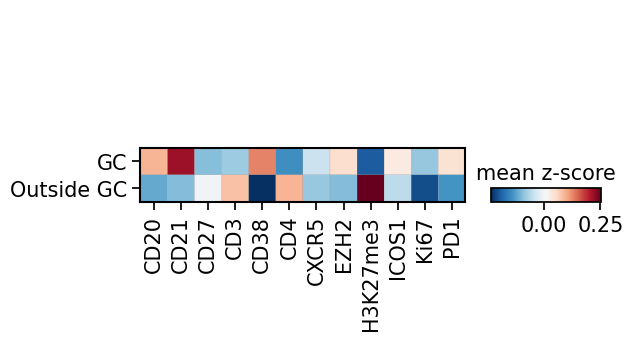

In [109]:
sc.tl.dendrogram(adata_IMC, groupby='Region_GC')
sns.set_context("notebook", font_scale=1.5)
sc.pl.matrixplot(
    adata_IMC,
    adata_IMC.var_names.tolist(),
    'Region_GC',
    dendrogram=True,
    colorbar_title="mean z-score",
    cmap="RdBu_r",
    swap_axes=False,
)

## Spatial projection

In [110]:
from typing import List
import matplotlib
import skimage
from skimage import measure


def get_masks(mask_folder, dataset):
    """
    Function to get all mask from mask forlder
    """
    # Read masks
    masks = {}

    for (dirpath, dirnames, filenames) in os.walk(mask_folder):
        for name in sorted(filenames):
            if "tif" in name and dataset in name:
                filename = os.path.join(dirpath, name)
                img = skimage.io.imread(filename)
                condition = name.split(".")[0]
                masks[condition] = img
            else:
                continue
    return masks


def create_clustered_cell(mask, label2cell, my_cmap, **kwargs):
    img = np.zeros((mask.shape[0], mask.shape[1], 3), dtype=np.uint8)

    for i, cells in tqdm(label2cell.items(), total=len(label2cell)):
        rows, cols = np.where(np.isin(mask, cells))
        img[rows, cols, :] = my_cmap[int(i)]

    return img


def get_contour(mask: np.ndarray) -> List[List[float]]:
    """
    Get contours of mask
    """
    contours = []
    for i in sorted(np.unique(mask)):
        if i == 0:
            continue
        contours.append(measure.find_contours(mask == i, 0.8)[0])

    return contours

In [111]:
masks = get_masks(data_dir / "masks", f"{experiment}")

In [112]:
colors = adata_IMC.uns["Region_GC_colors"]
labels = np.unique(adata_IMC.obs.Region_GC.tolist())

colors_rgb = []
for color in colors:
    colors_rgb.append(matplotlib.colors.hex2color(color))
colors_rgb = np.array(colors_rgb) * 255
colors_rgb = colors_rgb.astype(np.uint8)

In [113]:
# for dataset in adata_IMC.obs['Core'].unique():
#     adata_fov = adata_IMC[adata_IMC.obs['Core'] == dataset]
#     try:
#         mask = masks["_".join([experiment, dataset])]
#         contours = get_contour(mask)
#     except:
#         print(dataset)
#         continue
#      # Get label2cell dict
    
#     label2cell = {}
#     for i, l in enumerate(labels):
#         cell_id = adata_fov[adata_fov.obs.Region_GC == l].obs.Cell.to_list()
#         label2cell[i] = cell_id

#     img = create_clustered_cell(mask, label2cell, colors_rgb)

#     fig, ax = plt.subplots(figsize=(7, 7))
#     ax.imshow(img)
#     for j, contour in enumerate(contours):
#         ax.plot(contour[:, 1], contour[:, 0], linewidth=0.5, color="white")
#     ax.axis("off")
#     # fig.savefig(f'Region_GC_{dataset}.png', dpi=100, bbox_inches='tight', transparent=True, pad_inches=0)
#     plt.show()


## Metabolite comparison

In [114]:
adata.obs["Region"] = adata_IMC.obs["Type"]
adata.uns["Region_colors"] = adata_IMC.uns["Type_colors"]
adata_IMC.obs["Region"] = adata_IMC.obs["Type"]
adata_IMC.uns["Region_colors"] = adata_IMC.uns["Type_colors"]
adata.obs["Region_GC"] = adata_IMC.obs["Region_GC"]
adata.uns["Region_GC_colors"] = adata_IMC.uns["Region_GC_colors"]
adata.obsm["spatial"] = adata_IMC.obsm["spatial"]

         Falling back to preprocessing with `sc.pp.pca` and default params.
computing PCA
    with n_comps=50
    finished (0:00:01)
Storing dendrogram info using `.uns['dendrogram_Region_GC']`
ranking genes
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:00)


C:\Users\thu71\Anaconda3\envs\athena\lib\site-packages\scanpy\tools\_rank_genes_groups.py:420: RuntimeWarning: invalid value encountered in log2
  self.stats[group_name, 'logfoldchanges'] = np.log2(
C:\Users\thu71\Anaconda3\envs\athena\lib\site-packages\scanpy\tools\_rank_genes_groups.py:420: RuntimeWarning: invalid value encountered in log2
  self.stats[group_name, 'logfoldchanges'] = np.log2(


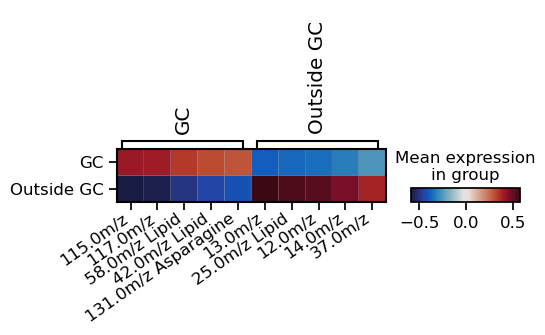

In [115]:
sc.tl.dendrogram(adata, groupby='Region_GC')
sc.tl.rank_genes_groups(adata, groupby='Region_GC', method='t-test_overestim_var', use_raw=False)

with sns.plotting_context('notebook', font_scale=1.2):
    ax = sc.pl.rank_genes_groups_matrixplot(adata, n_genes=5, use_raw=False, cmap=heatmap_cmp, show=False, 
                                           # standard_scale='var'
                                           )
    xticklabels = ax['mainplot_ax'].get_xticklabels()
    ax['mainplot_ax'].set_xticklabels(xticklabels, rotation = 35, ha="right")
    ax['mainplot_ax'].tick_params(axis='x', pad=0)
    plt.show()

In [116]:
# Extract diff expression dataframe
dedf = sc.get.rank_genes_groups_df(adata, group=None)

# Get top diff expression
topk=20
masses_largest = dedf.groupby('group').apply(lambda x: x.nlargest(topk,['scores'])).names.unique()
masses_lowest = dedf.groupby('group').apply(lambda x: x.nsmallest(topk,['scores'])).names.unique()
# masses = np.unique(np.concatenate([masses_largest, masses_lowest]))
masses = masses_largest

In [117]:
# Extract dataframe
var = 'Region_GC'

adata_subset = adata[:,masses]
df_SIMS = pd.DataFrame(adata_subset.X, columns=adata_subset.var_names)
df_SIMS[var] = adata_subset.obs[var].tolist()

df_SIMS_grouped = df_SIMS.groupby([var]).mean()

    using data matrix X directly
Storing dendrogram info using `.uns['dendrogram_Region_GC']`


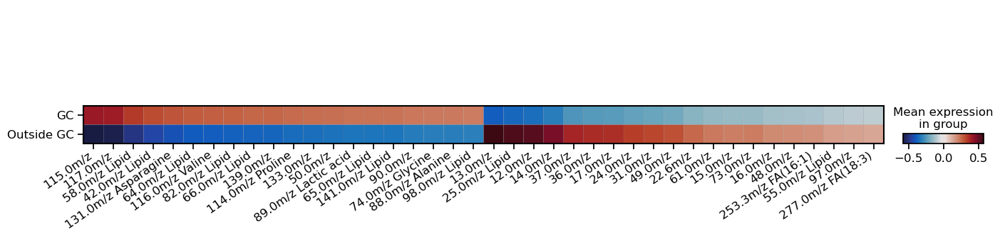

In [118]:
adata_grouped = ad.AnnData(df_SIMS_grouped.values)
adata_grouped.var_names = df_SIMS_grouped.columns.tolist()
adata_grouped.obs[var] = df_SIMS_grouped.index.tolist()
adata_grouped.obs[var] = adata_grouped.obs[var].astype('category')

sc.tl.dendrogram(adata_grouped, groupby=var)
with sns.plotting_context('notebook', font_scale=1.2):
    ax = sc.pl.matrixplot(adata_grouped, var_names=adata_grouped.var_names, 
                     groupby=var, cmap=heatmap_cmp,
                     dendrogram=True, show=False)     
    xticklabels = ax['mainplot_ax'].get_xticklabels()
    ax['mainplot_ax'].set_xticklabels(xticklabels, rotation = 35, ha="right")
    ax['mainplot_ax'].tick_params(axis='x', pad=0)
    plt.show()

In [119]:
sc.tl.dendrogram(adata_IMC, groupby='Region')

    using data matrix X directly
Storing dendrogram info using `.uns['dendrogram_Region']`


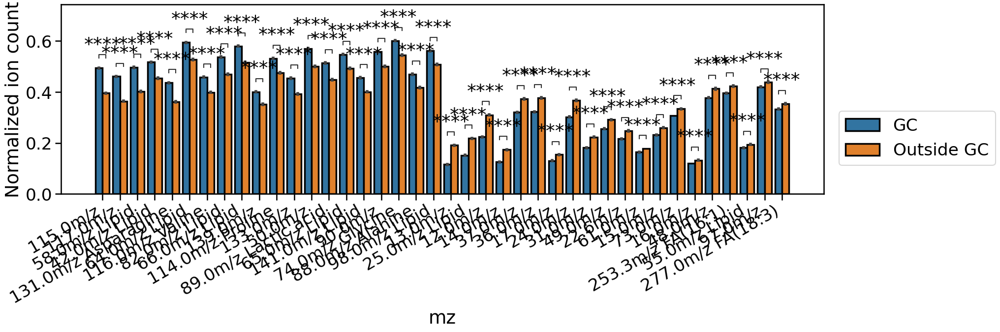

In [120]:
sns.set_context('talk', font_scale=1.5)
from statannotations.Annotator import Annotator

# Get subset of masses
adata_subset = adata[:,masses]

# Get dataframe
df_SIMS = pd.DataFrame(adata_subset.X, columns=adata_subset.var_names)
df_SIMS[var] = adata_subset.obs[var].tolist()
df_SIMS.iloc[:,:-1] = MinMaxScaler().fit_transform(df_SIMS.iloc[:,:-1].values)

# Sort masses by GC eexpression
df_SIMS_var = (df_SIMS
                .melt(id_vars=var, var_name='mz', value_name='Normalized ion count'))

# Plot
hue_order = adata_IMC.uns[f'dendrogram_{var}']['categories_ordered']
palette = adata_IMC.uns[f'{var}_colors'][adata_IMC.uns[f'dendrogram_{var}']['categories_idx_ordered']]

fig, ax = plt.subplots(figsize=(20,5))
sns.barplot(data=df_SIMS_var, hue=var, x='mz', y='Normalized ion count', linewidth=2.5, edgecolor='k',
            hue_order = hue_order, ax=ax, palette=palette)
plt.xticks(rotation = 30, ha='right')
plt.legend(bbox_to_anchor=(1.02, 0.15), loc='lower left', borderaxespad=0)

pairs = [((e,hue_order[0]),(e,hue_order[1])) for e in masses]
annot = Annotator(ax, pairs, data=df_SIMS_var, hue=var, x='mz', y='Normalized ion count', hue_order = hue_order)
annot.configure(test='Mann-Whitney', text_format='star', loc='inside', verbose=0)
annot.apply_test()
ax, test_results = annot.annotate()
# ax.set(ylim=(.2, 1.))

### Manual selection

In [121]:
# glucose_frag = ['71.0m/z', '87.0m/z Pyruvic acid', '99.0m/z Lipid', '119.0m/z', '141.0m/z Lipidd', '74.0m/z Glycine',  '89.0m/z Lactic acid', '122.0m/z']
glucose_frag = ['119.0m/z', '74.0m/z Glycine',  '89.0m/z Lactic acid', '122.0m/z', ]

amino_acids = ['74.0m/z Glycine',  '88.0m/z Alanine', '104.0m/z Serine', '114.0m/z Proline', 
               '116.0m/z Valine', '118.0m/z Threonine', '120.0m/z Cysteine', 
               '130.0m/z Isoleucine/leucine', '131.0m/z Asparagine', '132.0m/z Aspartic acid', 
               '145.0m/z Glutamine', '146.0m/z Glutamic acid', '164.0m/z Phenylalanine']

cholesterol_frag = ['95.0m/z Cholesterol fragment', 
                    '109.0m/z Cholesterol fragment', 
                    '147.0m/z Cholesterol fragment',
                    '161.0m/z Cholesterol fragment']

lipids = [e for e in SIMS_nm_subset if 'Lipid' in e]

    using data matrix X directly
Storing dendrogram info using `.uns['dendrogram_Region_GC']`


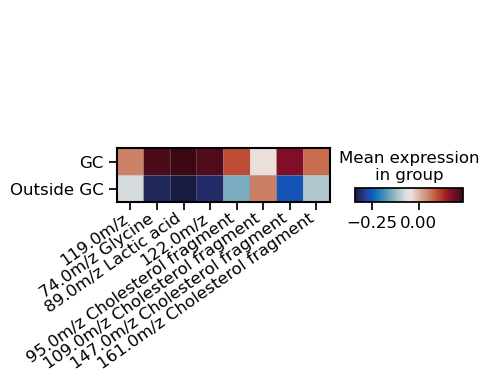

In [122]:
# Plot glucose
adata_subset = adata[:,glucose_frag+cholesterol_frag]
df_SIMS = pd.DataFrame(adata_subset.X, columns=adata_subset.var_names)
df_SIMS[var] = adata_subset.obs[var].tolist()
df_SIMS_grouped = df_SIMS.groupby([var]).mean()

adata_grouped = ad.AnnData(df_SIMS_grouped.values)
adata_grouped.var_names = df_SIMS_grouped.columns.tolist()
adata_grouped.obs[var] = df_SIMS_grouped.index.tolist()
adata_grouped.obs[var] = adata_grouped.obs[var].astype('category')

sc.tl.dendrogram(adata_grouped, groupby=var)
with sns.plotting_context('notebook', font_scale=1.2):
    ax = sc.pl.matrixplot(adata_grouped, var_names=adata_grouped.var_names, 
                     groupby=var, cmap=heatmap_cmp, 
                     dendrogram=True, show=False)     
    xticklabels = ax['mainplot_ax'].get_xticklabels()
    ax['mainplot_ax'].set_xticklabels(xticklabels, rotation = 35, ha="right")
    ax['mainplot_ax'].tick_params(axis='x', pad=0)
    plt.show()

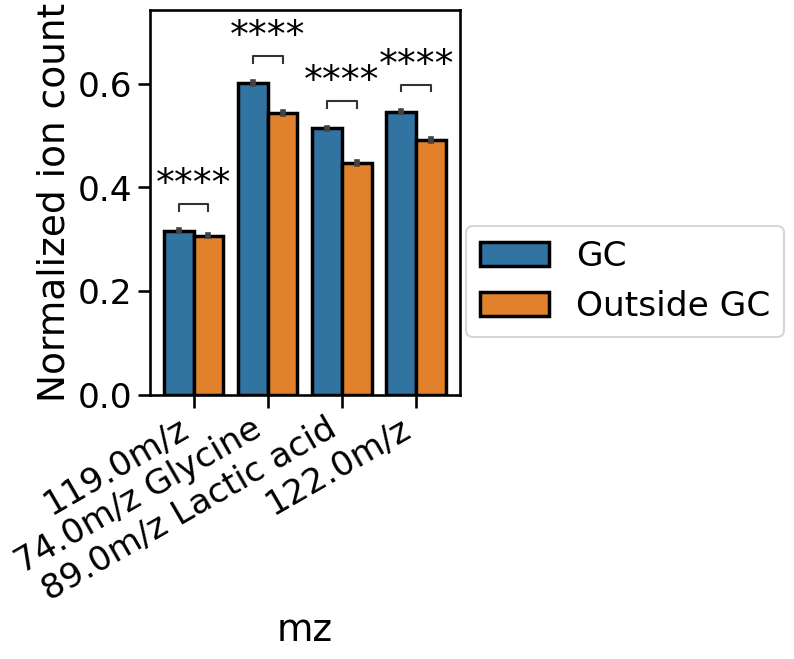

In [123]:
# Get subset of masses
adata_subset = adata[:,glucose_frag]

# Get dataframe
df_SIMS = pd.DataFrame(adata_subset.X, columns=adata_subset.var_names)
df_SIMS[var] = adata_subset.obs[var].tolist()
df_SIMS.iloc[:,:-1] = MinMaxScaler().fit_transform(df_SIMS.iloc[:,:-1].values)

# Sort masses by GC eexpression
df_SIMS_var = (df_SIMS
                .melt(id_vars=var, var_name='mz', value_name='Normalized ion count'))

# Plot
hue_order = adata_IMC.uns[f'dendrogram_{var}']['categories_ordered']
palette = adata_IMC.uns[f'{var}_colors'][adata_IMC.uns[f'dendrogram_{var}']['categories_idx_ordered']]

fig, ax = plt.subplots(figsize=(4,5))
sns.barplot(data=df_SIMS_var, hue=var, x='mz', y='Normalized ion count', linewidth=2.5, edgecolor='k',
            hue_order = hue_order, ax=ax, palette=palette)
plt.xticks(rotation = 30, ha='right')
plt.legend(bbox_to_anchor=(1.02, 0.15), loc='lower left', borderaxespad=0)

pairs = [((e,hue_order[0]),(e,hue_order[1])) for e in glucose_frag]
annot = Annotator(ax, pairs, data=df_SIMS_var, hue=var, x='mz', y='Normalized ion count', hue_order = hue_order)
annot.configure(test='Mann-Whitney', text_format='star', loc='inside', verbose=0)
annot.apply_test()
ax, test_results = annot.annotate()


In [124]:
df_SIMS_var.to_clipboard()

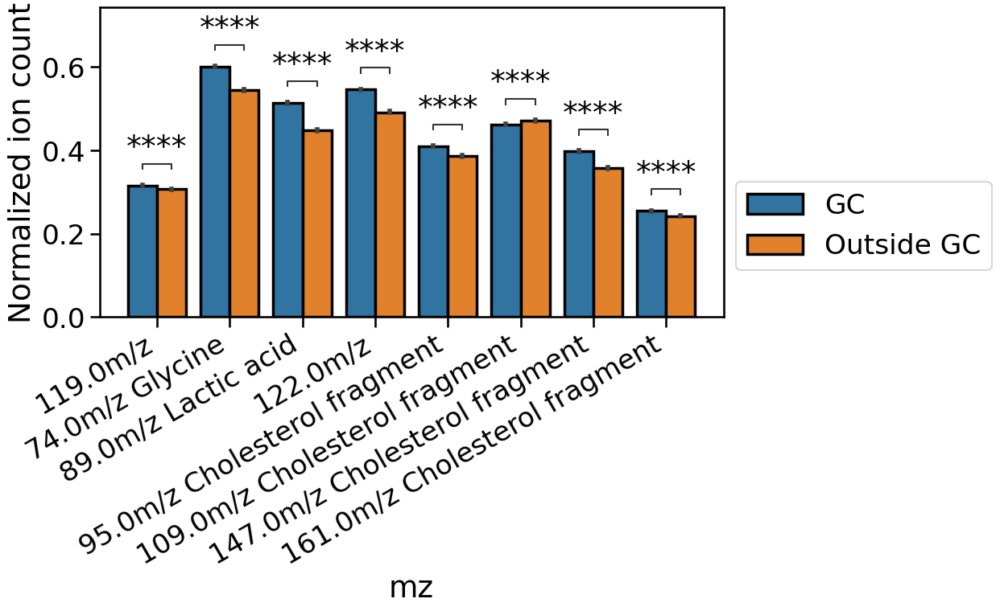

In [125]:
# Get subset of masses
adata_subset = adata[:,glucose_frag+cholesterol_frag]

# Get dataframe
df_SIMS = pd.DataFrame(adata_subset.X, columns=adata_subset.var_names)
df_SIMS[var] = adata_subset.obs[var].tolist()
df_SIMS.iloc[:,:-1] = MinMaxScaler().fit_transform(df_SIMS.iloc[:,:-1].values)

# Sort masses by GC eexpression
df_SIMS_var = (df_SIMS
                .melt(id_vars=var, var_name='mz', value_name='Normalized ion count'))

# Plot
hue_order = adata_IMC.uns[f'dendrogram_{var}']['categories_ordered']
palette = adata_IMC.uns[f'{var}_colors'][adata_IMC.uns[f'dendrogram_{var}']['categories_idx_ordered']]


fig, ax = plt.subplots(figsize=(10,5))
sns.barplot(data=df_SIMS_var, hue=var, x='mz', y='Normalized ion count', linewidth=2.5, edgecolor='k',
            hue_order = hue_order, ax=ax, palette=palette)
plt.xticks(rotation = 30, ha='right')
plt.legend(bbox_to_anchor=(1.02, 0.15), loc='lower left', borderaxespad=0)

pairs = [((e,hue_order[0]),(e,hue_order[1])) for e in glucose_frag+cholesterol_frag]
annot = Annotator(ax, pairs, data=df_SIMS_var, hue=var, x='mz', y='Normalized ion count', hue_order = hue_order)
annot.configure(test='Mann-Whitney', text_format='star', loc='inside', verbose=0)
annot.apply_test()
ax, test_results = annot.annotate()


    using data matrix X directly
Storing dendrogram info using `.uns['dendrogram_Region_GC']`


C:\Users\thu71\Anaconda3\envs\athena\lib\site-packages\scanpy\tools\_dendrogram.py:161: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[key_added] = dat


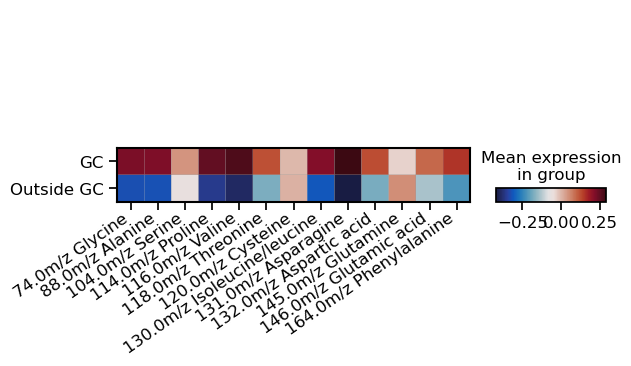

In [126]:
# Plot glucose
adata_subset = adata[:,amino_acids]
df_SIMS = pd.DataFrame(adata_subset.X, columns=adata_subset.var_names)
df_SIMS[var] = adata_subset.obs[var].tolist()
df_SIMS_grouped = df_SIMS.groupby([var]).mean()

adata_grouped = ad.AnnData(df_SIMS_grouped.values)
adata_grouped.var_names = df_SIMS_grouped.columns.tolist()
adata_grouped.obs[var] = df_SIMS_grouped.index.tolist()
adata_grouped.obs[var] = adata_grouped.obs[var].astype('category')
adata_grouped = adata_grouped[adata_grouped.obs[var] != 'Other']

sc.tl.dendrogram(adata_grouped, groupby=var)
with sns.plotting_context('notebook', font_scale=1.2):
    ax = sc.pl.matrixplot(adata_grouped, var_names=adata_grouped.var_names, 
                     groupby=var, cmap=heatmap_cmp,
                     dendrogram=True, show=False)     
    xticklabels = ax['mainplot_ax'].get_xticklabels()
    ax['mainplot_ax'].set_xticklabels(xticklabels, rotation = 35, ha="right")
    ax['mainplot_ax'].tick_params(axis='x', pad=0)
    plt.show()

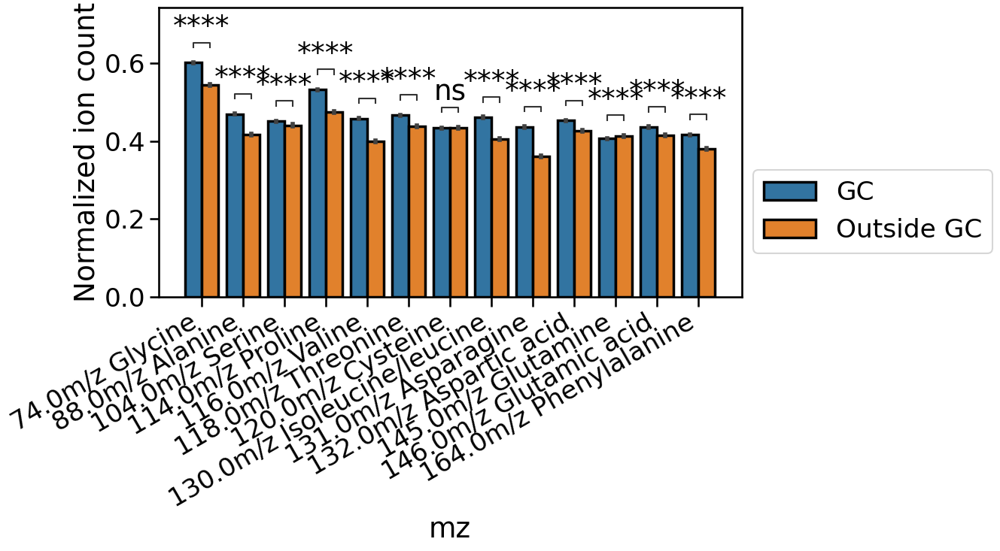

In [127]:
# Get subset of masses
adata_subset = adata[:,amino_acids]

# Get dataframe
df_SIMS = pd.DataFrame(adata_subset.X, columns=adata_subset.var_names)
df_SIMS[var] = adata_subset.obs[var].tolist()
df_SIMS.iloc[:,:-1] = MinMaxScaler().fit_transform(df_SIMS.iloc[:,:-1].values)

# Sort masses by GC eexpression
df_SIMS_var = (df_SIMS
                .melt(id_vars=var, var_name='mz', value_name='Normalized ion count'))

# Plot
hue_order = adata_IMC.uns[f'dendrogram_{var}']['categories_ordered']
palette = adata_IMC.uns[f'{var}_colors'][adata_IMC.uns[f'dendrogram_{var}']['categories_idx_ordered']]

fig, ax = plt.subplots(figsize=(10,5))
sns.barplot(data=df_SIMS_var, hue=var, x='mz', y='Normalized ion count', linewidth=2.5, edgecolor='k',
            hue_order = hue_order, ax=ax, palette=palette)
plt.xticks(rotation = 30, ha='right')
plt.legend(bbox_to_anchor=(1.02, 0.15), loc='lower left', borderaxespad=0)

pairs = [((e,hue_order[0]),(e,hue_order[1])) for e in amino_acids]
annot = Annotator(ax, pairs, data=df_SIMS_var, hue=var, x='mz', y='Normalized ion count', hue_order = hue_order)
annot.configure(test='Mann-Whitney', text_format='star', loc='inside', verbose=0)
annot.apply_test()
ax, test_results = annot.annotate()


    using data matrix X directly
Storing dendrogram info using `.uns['dendrogram_Region_GC']`


C:\Users\thu71\Anaconda3\envs\athena\lib\site-packages\scanpy\tools\_dendrogram.py:161: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[key_added] = dat


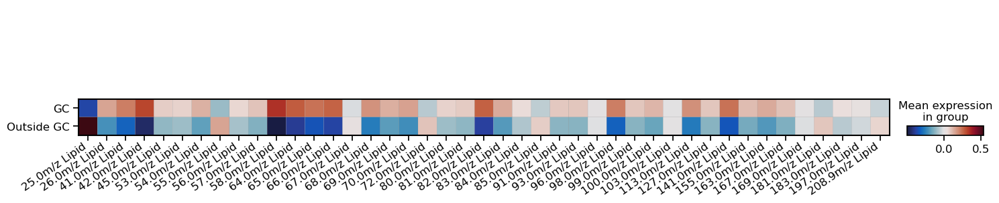

In [128]:
# Plot glucose
adata_subset = adata[:,lipids]
df_SIMS = pd.DataFrame(adata_subset.X, columns=adata_subset.var_names)
df_SIMS[var] = adata_subset.obs[var].tolist()
df_SIMS_grouped = df_SIMS.groupby([var]).mean()

adata_grouped = ad.AnnData(df_SIMS_grouped.values)
adata_grouped.var_names = df_SIMS_grouped.columns.tolist()
adata_grouped.obs[var] = df_SIMS_grouped.index.tolist()
adata_grouped.obs[var] = adata_grouped.obs[var].astype('category')
adata_grouped = adata_grouped[adata_grouped.obs[var] != 'Other']

sc.tl.dendrogram(adata_grouped, groupby=var)
with sns.plotting_context('notebook', font_scale=1.2):
    ax = sc.pl.matrixplot(adata_grouped, var_names=adata_grouped.var_names, 
                     groupby=var, cmap=heatmap_cmp,
                     dendrogram=True, show=False)     
    xticklabels = ax['mainplot_ax'].get_xticklabels()
    ax['mainplot_ax'].set_xticklabels(xticklabels, rotation = 35, ha="right")
    ax['mainplot_ax'].tick_params(axis='x', pad=0)
    plt.show()

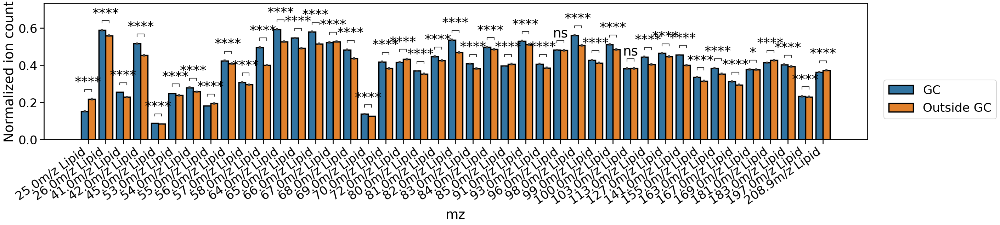

In [129]:
# Get subset of masses
adata_subset = adata[:,lipids]

# Get dataframe
df_SIMS = pd.DataFrame(adata_subset.X, columns=adata_subset.var_names)
df_SIMS[var] = adata_subset.obs[var].tolist()
df_SIMS.iloc[:,:-1] = MinMaxScaler().fit_transform(df_SIMS.iloc[:,:-1].values)

# Sort masses by GC eexpression
df_SIMS_var = (df_SIMS
                .melt(id_vars=var, var_name='mz', value_name='Normalized ion count'))

# Plot
hue_order = adata_IMC.uns[f'dendrogram_{var}']['categories_ordered']
palette = adata_IMC.uns[f'{var}_colors'][adata_IMC.uns[f'dendrogram_{var}']['categories_idx_ordered']]

fig, ax = plt.subplots(figsize=(30,5))
sns.barplot(data=df_SIMS_var, hue=var, x='mz', y='Normalized ion count', linewidth=2.5, edgecolor='k',
            hue_order = hue_order, ax=ax, palette=palette)
plt.xticks(rotation = 35, ha='right')
plt.legend(bbox_to_anchor=(1.02, 0.15), loc='lower left', borderaxespad=0)

pairs = [((e,hue_order[0]),(e,hue_order[1])) for e in lipids]
annot = Annotator(ax, pairs, data=df_SIMS_var, hue=var, x='mz', y='Normalized ion count', hue_order = hue_order)
annot.configure(test='Mann-Whitney', text_format='star', loc='inside', verbose=0)
annot.apply_test()
ax, test_results = annot.annotate()


### Plot by mz channel

In [130]:
import palettable
h5_data_dir = p_dir / "data" / "h5"
heatmap_cmp = palettable.cmocean.diverging.Balance_20.mpl_colormap

from typing import List
import matplotlib
import skimage
from skimage import measure

h5_data_dir = p_dir / "data" / "h5"

# Read mask image
def get_masks(mask_folder):
    """
    Function to get all mask from mask forlder
    """
    # Read masks
    masks = {}

    for (dirpath, dirnames, filenames) in os.walk(mask_folder):
        for name in sorted(filenames):
            if "tif" in name:
                filename = os.path.join(dirpath, name)
                img = skimage.io.imread(filename)
                condition = name.split(".")[0]
                masks[condition] = img
            else:
                continue
    return masks


def create_clustered_cell(mask, cell2count,  **kwargs):
    img = np.zeros((mask.shape[0], mask.shape[1]))*np.nan

    for cell, counts in tqdm(cell2count.items(), total=len(cell2count)):
        rows, cols = np.where(np.isin(mask, cell))
        img[rows, cols] = counts

    return img

def get_contour(mask: np.ndarray) -> List[List[float]]:
    """
    Get contours of mask
    """
    contours = []
    for i in sorted(np.unique(mask)):
        if i == 0:
            continue
        contours.append(measure.find_contours(mask == i, 0.8)[0])

    return contours

def get_imgs_sims(experiment, name):
    with h5py.File(h5_data_dir / f"{experiment}.hdf5", "r") as f:
        imgs = f[name][:]
        labels = list(f[name].attrs["labels"])
    return imgs[2:], labels[2:]

def IMS(imgs, mz, masses):
    mz_img = imgs[np.equal(masses, mz),...][0]
    fig, ax = plt.subplots(figsize=(10,10))
    ax.imshow(mz_img, cmap='rainbow', interpolation='quadric', vmin=0, vmax=np.percentile(mz_img, 90))  
    ax.axis('off')
    plt.title(f'{mz} m/z')
    plt.show()
    return mz_img 

def get_imgs_sims(experiment, name):
    with h5py.File(h5_data_dir / f"{experiment}.hdf5", "r") as f:
        imgs = f[name][:]
        labels = list(f[name].attrs["labels"])
    return imgs[2:], labels[2:]

def IMS(imgs, mz, masses):
    mz_img = imgs[np.equal(masses, mz),...][0]
    # fig, ax = plt.subplots(figsize=(7,7))
    # ax.imshow(mz_img, cmap=heatmap_cmp, interpolation='quadric', vmin=0,vmax=np.percentile(mz_img, 99))  
    # ax.axis('off')
    # plt.title(f'{mz} m/z')
    # plt.show()
    return mz_img 

In [131]:
masks = get_masks(data_dir / "masks")
experiment='tonsil'

  0%|          | 0/2711 [00:00<?, ?it/s]

  0%|          | 0/2711 [00:00<?, ?it/s]

  0%|          | 0/2711 [00:00<?, ?it/s]

  0%|          | 0/2711 [00:00<?, ?it/s]

  0%|          | 0/2711 [00:00<?, ?it/s]

  0%|          | 0/2711 [00:00<?, ?it/s]

  0%|          | 0/2711 [00:00<?, ?it/s]

  0%|          | 0/2711 [00:00<?, ?it/s]

  0%|          | 0/2711 [00:00<?, ?it/s]

  0%|          | 0/2711 [00:00<?, ?it/s]

  0%|          | 0/2711 [00:00<?, ?it/s]

  0%|          | 0/2711 [00:00<?, ?it/s]

  0%|          | 0/2711 [00:00<?, ?it/s]

  0%|          | 0/2711 [00:00<?, ?it/s]

  0%|          | 0/2711 [00:00<?, ?it/s]

  0%|          | 0/2711 [00:00<?, ?it/s]

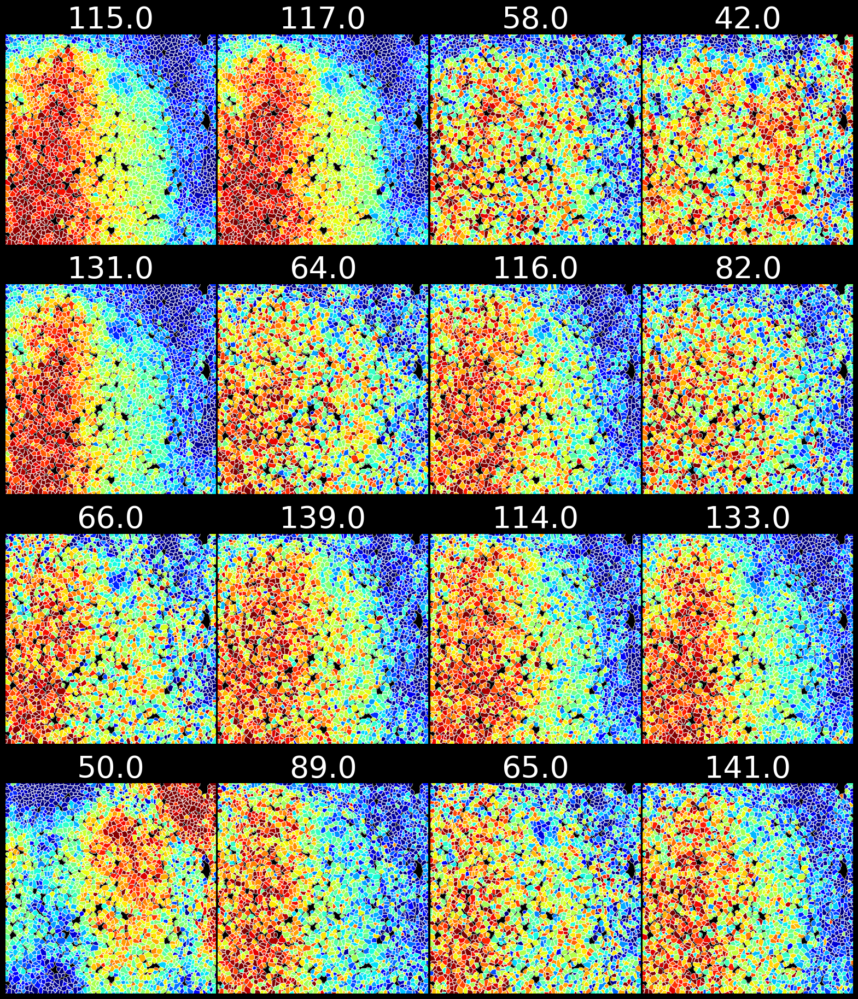

In [132]:
dataset = 'DonorA_1'

mask = masks[experiment + '_' + dataset]
contours = get_contour(mask)

adata_fov = adata[adata.obs['Dataset'] == dataset]

fig, axs = plt.subplots(4,4,figsize=(20, 23), facecolor='k')
axs = axs.flatten()
for i, channel in enumerate(masses[:16]):
    ax = axs[i]
    
    adata_subset = adata_fov[:, channel]
    # Get label2cell dict
    cells = adata_subset.obs['Cell'].to_list()
    counts = adata_subset.X.flatten()
    cell2count = dict(zip(cells, counts))

    img = create_clustered_cell(mask, cell2count)

    ax.imshow(img, cmap='jet', vmin=np.nanpercentile(img, 5), vmax=np.nanpercentile(img, 95))
    ax.set_title(f"{channel.split('m/z')[0]}", size=40, c='w')
    for j, contour in enumerate(contours):
        ax.plot(contour[:, 1], contour[:, 0], linewidth=0.5, color="white")
    ax.axis("off")
fig.subplots_adjust(wspace=0.01, hspace=0.14)
plt.show()

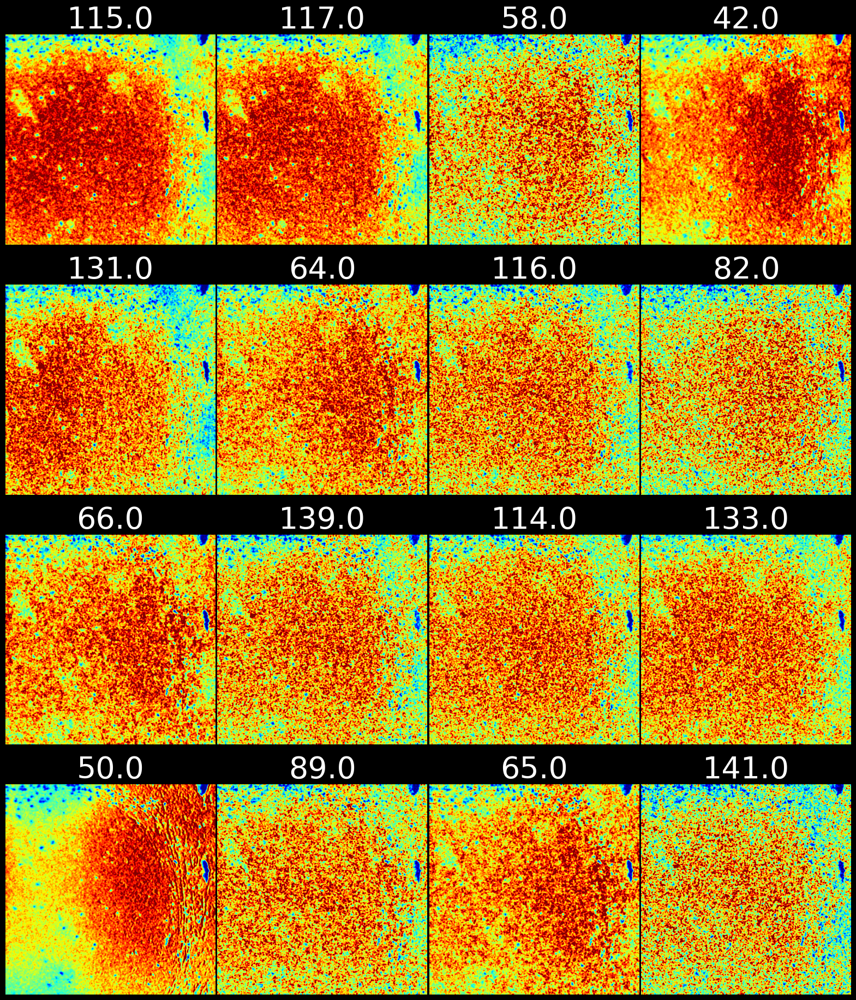

In [133]:
imgs, labels = get_imgs_sims(experiment, 'auto_'+dataset)
mzs = np.array(df_intensity_TS.columns.tolist()).astype(float)

fig, axs = plt.subplots(4,4,figsize=(20, 23), facecolor='k')
axs = axs.flatten()
for i, channel in enumerate(masses[:16]):
    ax = axs[i]
    ax.axis("off")
    mz = float(channel.split('m/z')[0])
    mz_img = IMS(imgs, mz, mzs)
    mz_img = skimage.transform.resize(mz_img, mask.shape, anti_aliasing=True, anti_aliasing_sigma=1)
    
    ax.imshow(mz_img, cmap='jet', interpolation=None, vmin=0, vmax=np.percentile(mz_img, 95))
    ax.set_title(mz, size=40, c='w')
    ax.axis("off")
fig.subplots_adjust(wspace=0.01, hspace=0.15)
plt.show()


### Plot one mz for couple of ROI

In [134]:
datasets_subset = ['DonorA_1',
 'DonorA_2',                  
 'DonorA_3',
 'DonorA_5',               
 'DonorE_1',
 'DonorA_2',                  
 'DonorE_3',
 'DonorE_4',   
]

In [135]:
masses

array(['115.0m/z', '117.0m/z', '58.0m/z Lipid', '42.0m/z Lipid',
       '131.0m/z Asparagine', '64.0m/z Lipid', '116.0m/z Valine',
       '82.0m/z Lipid', '66.0m/z Lipid', '139.0m/z', '114.0m/z Proline',
       '133.0m/z', '50.0m/z', '89.0m/z Lactic acid', '65.0m/z Lipid',
       '141.0m/z Lipid', '90.0m/z', '74.0m/z Glycine', '88.0m/z Alanine',
       '98.0m/z Lipid', '13.0m/z', '25.0m/z Lipid', '12.0m/z', '14.0m/z',
       '37.0m/z', '36.0m/z', '17.0m/z', '24.0m/z', '31.0m/z', '49.0m/z',
       '22.6m/z', '61.0m/z', '15.0m/z', '73.0m/z', '16.0m/z', '48.0m/z',
       '253.3m/z FA(16:1)', '55.0m/z Lipid', '97.0m/z',
       '277.0m/z FA(18:3)'], dtype=object)

In [136]:

cholesterol_frag = ['95.0m/z Cholesterol fragment', 
                    '109.0m/z Cholesterol fragment', 
                    '147.0m/z Cholesterol fragment',
                    '161.0m/z Cholesterol fragment']

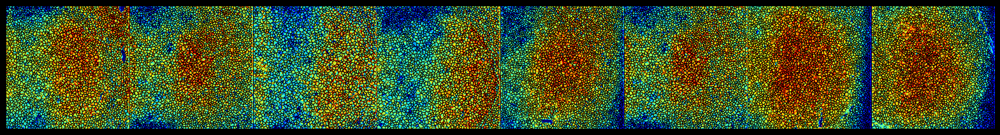

In [137]:
fig, axs = plt.subplots(1,8,figsize=(20,4), facecolor='k')
axs = axs.flatten()
channel = '74m/z Glycine'


for i, dataset in enumerate(datasets_subset):
    mask = masks[experiment + '_' + dataset]
    contours = get_contour(mask)

    imgs, labels = get_imgs_sims(experiment, 'auto_'+dataset)
    mzs = np.array(df_intensity_TS.columns.tolist()).astype(float)
    imgs_stack = skimage.transform.resize(imgs, (imgs.shape[0], mask.shape[0], mask.shape[0]), order=2, preserve_range=True, anti_aliasing=False)
    mean = np.mean(imgs_stack, axis=0, keepdims=False)+1
    
    ax = axs[i]
    ax.axis("off")
    mz = float(channel.split('m/z')[0])
    mz_img = IMS(imgs, mz, mzs)
    mz_img = skimage.transform.resize(mz_img, mask.shape, anti_aliasing=True, anti_aliasing_sigma=1)
    mz_img = mz_img/mean 
    
    ax.imshow(mz_img, cmap='jet', interpolation=None, 
              vmin=np.percentile(mz_img, 1), 
              vmax=np.percentile(mz_img, 98))
    for j, contour in enumerate(contours):
        ax.plot(contour[:, 1], contour[:, 0], linewidth=0.5, color="k")
    ax.axis("off")

fig.subplots_adjust(wspace=0.01)

In [138]:
channel = '74.0m/z Glycine'

  0%|          | 0/2711 [00:00<?, ?it/s]

  0%|          | 0/3047 [00:00<?, ?it/s]

  0%|          | 0/2107 [00:00<?, ?it/s]

  0%|          | 0/2540 [00:00<?, ?it/s]

  0%|          | 0/3401 [00:00<?, ?it/s]

  0%|          | 0/3047 [00:00<?, ?it/s]

  0%|          | 0/3037 [00:00<?, ?it/s]

  0%|          | 0/3150 [00:00<?, ?it/s]

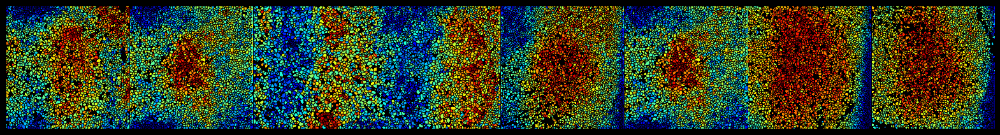

In [139]:
fig, axs = plt.subplots(1,8,figsize=(20,5), facecolor='k')
axs = axs.flatten()

for i, dataset in enumerate(datasets_subset):
    mask = masks[experiment + '_' + dataset]
    contours = get_contour(mask)

    adata_subset = adata[adata.obs['Dataset'] == dataset, channel]
    
    # Get label2cell dict
    cells = adata_subset.obs['Cell'].to_list()
    counts = adata_subset.X.flatten()
    cell2count = dict(zip(cells, counts))

    img = create_clustered_cell(mask, cell2count)
    
    ax = axs[i]
    ax.axis("off")

    ax.get_xaxis().set_visible(False)
    ax.get_yaxis().set_visible(False)
    ax.set_facecolor('darkblue')
    ax.imshow(img, cmap='jet', vmin=np.nanpercentile(img, 2), vmax=np.nanpercentile(img, 98))
    for j, contour in enumerate(contours):
        ax.plot(contour[:, 1], contour[:, 0], linewidth=0.5, color="k")

fig.subplots_adjust(wspace=0.01)

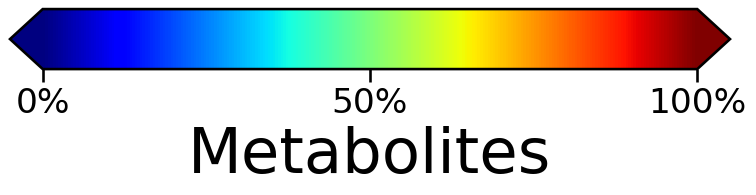

In [140]:
import matplotlib.pyplot as plt
import matplotlib as mpl
from matplotlib.ticker import PercentFormatter

plt.rcParams.update({'font.size':50})

# Make a figure and axes with dimensions as desired.
fig = plt.figure(figsize=(8, 4))
ax1 = fig.add_axes([0.05, 0.80, 0.9, 0.15])

norm = mpl.colors.Normalize(vmin=0., vmax=1)

# Fist Cell type
cb1 = mpl.colorbar.ColorbarBase(ax1, cmap='jet',
                                norm=norm, extend='both',
                                orientation='horizontal',
                               ticks=[0, 0.5, 1])
cb1.set_label(f'Metabolites', fontsize=45)
cb1.ax.xaxis.set_major_formatter(PercentFormatter(1, 0))


# Comparison inside GC

In [141]:
adata_z = adata[~adata.obs['Region'].isin(['B cell Outside GC', 'T-cells Outside GC'])]
adata_z.obs['Region_Zone'] = 'GC LZ'
region_zone = adata_z.obs['Region_Zone'].to_numpy()
region_zone[(adata_z.obs['Region'] == 'GC DZ').tolist()] = 'GC DZ'
adata_z.obs['Region_Zone'] = region_zone
adata_z.obs['Region_Zone'] = adata_z.obs['Region_Zone'].astype('category')

C:\Users\thu71\AppData\Local\Temp\ipykernel_34460\203167237.py:2: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  adata_z.obs['Region_Zone'] = 'GC LZ'
C:\Users\thu71\Anaconda3\envs\athena\lib\site-packages\anndata\_core\anndata.py:1830: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")
C:\Users\thu71\Anaconda3\envs\athena\lib\site-packages\anndata\_core\anndata.py:1830: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")


    using 'X_pca' with n_pcs = 50
Storing dendrogram info using `.uns['dendrogram_Region_Zone']`
ranking genes
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:00)


C:\Users\thu71\Anaconda3\envs\athena\lib\site-packages\scanpy\tools\_rank_genes_groups.py:420: RuntimeWarning: invalid value encountered in log2
  self.stats[group_name, 'logfoldchanges'] = np.log2(
C:\Users\thu71\Anaconda3\envs\athena\lib\site-packages\scanpy\tools\_rank_genes_groups.py:420: RuntimeWarning: invalid value encountered in log2
  self.stats[group_name, 'logfoldchanges'] = np.log2(


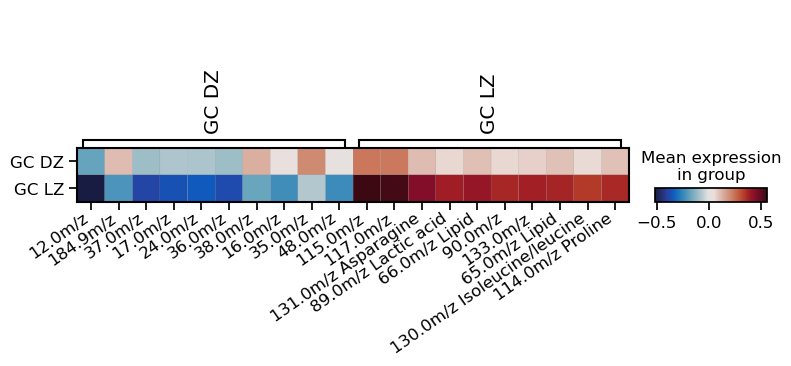

In [142]:
sc.tl.dendrogram(adata_z, groupby='Region_Zone')
sc.tl.rank_genes_groups(adata_z, groupby='Region_Zone', method='t-test_overestim_var', use_raw=False)

with sns.plotting_context('notebook', font_scale=1.2):
    ax = sc.pl.rank_genes_groups_matrixplot(adata_z, n_genes=10, use_raw=False, cmap=heatmap_cmp, show=False, 
                                           # standard_scale='var'
                                           )
    xticklabels = ax['mainplot_ax'].get_xticklabels()
    ax['mainplot_ax'].set_xticklabels(xticklabels, rotation = 35, ha="right")
    ax['mainplot_ax'].tick_params(axis='x', pad=0)
    plt.show()

In [143]:
# Extract diff expression dataframe
dedf = sc.get.rank_genes_groups_df(adata_z, group=None)

# Get top diff expression
topk=15
masses_largest = dedf.groupby('group').apply(lambda x: x.nlargest(topk,['scores'])).names.unique()
masses_lowest = dedf.groupby('group').apply(lambda x: x.nsmallest(topk,['scores'])).names.unique()
# masses = np.unique(np.concatenate([masses_largest, masses_lowest]))
masses = masses_largest

In [144]:
# Extract dataframe
var = 'Region_Zone'

adata_subset = adata_z[:,masses]
df_SIMS = pd.DataFrame(adata_subset.X, columns=adata_subset.var_names)
df_SIMS[var] = adata_subset.obs[var].tolist()

df_SIMS_grouped = df_SIMS.groupby([var]).median()

    using data matrix X directly
Storing dendrogram info using `.uns['dendrogram_Region_Zone']`


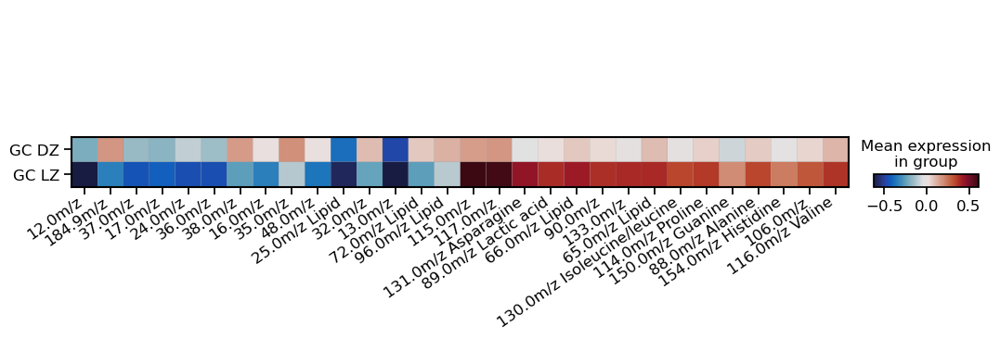

In [145]:
adata_grouped = ad.AnnData(df_SIMS_grouped.values)
adata_grouped.var_names = df_SIMS_grouped.columns.tolist()
adata_grouped.obs[var] = df_SIMS_grouped.index.tolist()
adata_grouped.obs[var] = adata_grouped.obs[var].astype('category')

sc.tl.dendrogram(adata_grouped, groupby=var)
with sns.plotting_context('notebook', font_scale=1.2):
    ax = sc.pl.matrixplot(adata_grouped, var_names=adata_grouped.var_names, 
                     groupby=var, cmap=heatmap_cmp,
                     dendrogram=True, show=False)     
    xticklabels = ax['mainplot_ax'].get_xticklabels()
    ax['mainplot_ax'].set_xticklabels(xticklabels, rotation = 35, ha="right")
    ax['mainplot_ax'].tick_params(axis='x', pad=0)
    plt.show()

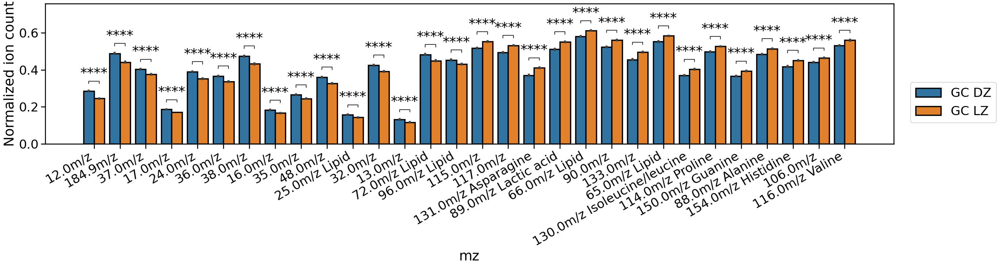

In [146]:
sns.set_context('talk', font_scale=1.5)
from statannotations.Annotator import Annotator

# Get subset of masses
adata_subset = adata_z[:,masses]

# Get dataframe
df_SIMS = pd.DataFrame(adata_subset.X, columns=adata_subset.var_names)
df_SIMS[var] = adata_subset.obs[var].tolist()
df_SIMS.iloc[:,:-1] = MinMaxScaler().fit_transform(df_SIMS.iloc[:,:-1].values)

# Sort masses by GC eexpression
df_SIMS_var = (df_SIMS
                .melt(id_vars=var, var_name='mz', value_name='Normalized ion count'))

# Plot
fig, ax = plt.subplots(figsize=(30,5))
sns.barplot(data=df_SIMS_var, hue=var, x='mz', y='Normalized ion count', linewidth=2.5, edgecolor='k',
            ax=ax,)
plt.xticks(rotation = 30, ha='right')
plt.legend(bbox_to_anchor=(1.02, 0.15), loc='lower left', borderaxespad=0)

pairs = [((e,'GC LZ'),(e,'GC DZ')) for e in masses]
annot = Annotator(ax, pairs, data=df_SIMS_var, hue=var, x='mz', y='Normalized ion count')
annot.configure(test='Mann-Whitney', text_format='star', loc='inside', verbose=0)
annot.apply_test()
ax, test_results = annot.annotate()
# ax.set(ylim=(.2, 1.))

In [147]:
df_SIMS_var.to_clipboard()

# Competition

In [148]:
# Import spatial omics library
import athena as ath
from spatialOmics import SpatialOmics

# import default graph builder parameters
from athena.graph_builder.constants import GRAPH_BUILDER_DEFAULT_PARAMS
from matplotlib.colors import ListedColormap

In [149]:
import networkx as nx
import numpy as np
import pandas as pd

def get_node_interactions(g: nx.Graph, data: pd.Series = None):
    # NOTE: The data pd.Series is categorical with globally all categories

    source, neighs = [], []
    for i in g.nodes:
        if len(g[i]) > 0:  # some nodes might have no neighbors
            source.append(i)
            neighs.append(list(g[i]))

    node_interactions = pd.DataFrame({'source': source, 'target': neighs}).explode('target')
    if data is not None:
        node_interactions['source_label'] = data.loc[node_interactions.source].values
        node_interactions['target_label'] = data.loc[node_interactions.target].values

    return node_interactions

def get_interaction_type(node_interactions: pd.DataFrame, interaction=('GC B-cell', 'FDC')):
    
    # Get rid of source == target rows
    nint = node_interactions[~(node_interactions.source == node_interactions.target)]
    
    # Only need to look at one interaction direction A->B because B->A will be symetric
    (a1, a2) = interaction
    nint_filtered1 = nint[(nint.source_label == a1) & (nint.target_label == a2)]
    nint_filtered2 = nint[(nint.source_label == a2) & (nint.target_label == a1)]
    return pd.concat([nint_filtered1, nint_filtered2])

# Plotting
def create_intensity_cell(mask, cell2intensity, **kwargs):
    img = np.zeros((mask.shape[0], mask.shape[1]), dtype=np.float)*np.nan

    for cell, intensity in tqdm(cell2intensity.items(), total=len(cell2intensity)):
        rows, cols = np.where(np.isin(mask, cell))
        img[rows, cols] = intensity
    return img

def get_masks(mask_folder, dataset):
    """
    Function to get all mask from mask forlder
    """
    # Read masks
    masks = {}

    for (dirpath, dirnames, filenames) in os.walk(mask_folder):
        for name in sorted(filenames):
            if "tif" in name and dataset in name:
                filename = os.path.join(dirpath, name)
                img = skimage.io.imread(filename)
                condition = name.split(".")[0]
                masks[condition] = img
            else:
                continue
    return masks

In [150]:
adata.obs['Region'] = (
    adata.obs['Region']
    .map(lambda x: {'B cell in GC': 'GC LZ'}.get(x, x))
    .astype("category")
)

In [151]:
# Create Spaital Omic data
import athena as ath
from spatialOmics import SpatialOmics

spadata = SpatialOmics()
spl = pd.DataFrame({'Dataset': adata.obs.Dataset.unique()})
spadata.spl = spl

for d in adata.obs.Dataset.unique():
    adata_subset = adata[adata.obs.Dataset == d, :]
    obs = adata_subset.obs.copy()
    obs['x'] = adata_subset.obsm['spatial'][:,1]
    obs['y'] = adata_subset.obsm['spatial'][:,0]
    obs['cell_id'] = obs['Cell']
    obs = obs.set_index('cell_id')
    spadata.obs[d] = obs
    spadata.X[d] = adata_subset.X
    spadata.var[d] = adata_subset.var
    spadata.masks[d] = {'cellmasks': masks["_".join([experiment, d])]}

In [152]:
# Loop through all region and create different cell neighborhood graph
datasets = spadata.spl.Dataset

for spl in datasets:
    # kNN graph
    config = GRAPH_BUILDER_DEFAULT_PARAMS['knn']
    config['builder_params']['n_neighbors'] = 5 # set parameter k
    ath.graph.build_graph(spadata, spl, builder_type='knn', mask_key='cellmasks', config=config)

    # Radius graph
    config = GRAPH_BUILDER_DEFAULT_PARAMS['radius']
    config['builder_params']['radius'] = 20 # set radius
    ath.graph.build_graph(spadata, spl, builder_type='radius', mask_key='cellmasks', config=config)
    
    # Contact graph
    config = GRAPH_BUILDER_DEFAULT_PARAMS['contact']
    config['builder_params']['radius'] = 1 # set parameter k
    ath.graph.build_graph(spadata, spl, builder_type='contact', mask_key='cellmasks',  config=config)
    

100%|█████████████████████████████████████████████████████████████████████████████| 3006/3006 [00:06<00:00, 500.12it/s]


In [169]:
attr = 'Region'
interaction=('GC LZ', 'TFH')
cmap1 = 'Oranges'
# cmap2 = 'Greens'
cmap2 = 'Blues'
mz = '103.0m/z Lipid'

ct1_ratios = []
ct2_ratios = []

# Import GC mask
masks_gc = get_masks(data_dir / "mask_border", f"{experiment}")

for spl in datasets:
    # Get sims 
    adata_sims_subset = adata_raw[adata_raw.obs.Dataset == spl]
    df_sims = pd.DataFrame(adata_sims_subset.X, columns=adata_sims_subset.var_names, index=adata_sims_subset.obs.Cell)

    # Get Graph info
    G = spadata.G[spl]['contact']
    
    # Extract cell interactions
    data = spadata.obs[spl][attr]
    node_interactions = get_node_interactions(G, data)

    # Get specific interationcs
    interactions = get_interaction_type(node_interactions, interaction)

    # Extract cell id
    cells  = np.unique(pd.concat([interactions.source, interactions.target]))
    
    # Get ratio per cell neighbors
    group = interactions.groupby(['source_label'])
    ratios = []

    for source, df_group in group:
        group_cell = df_group.groupby(['source'])
        for cell_id, df_cell in group_cell:
            # Get metabolites count on cell vs neighbor
            nei_list = df_cell.target.tolist()
            cell_sims = df_sims.loc[cell_id]
            nei_sims = df_sims.loc[nei_list]
            ratio = cell_sims.div(nei_sims.median())
            ratios.append(pd.DataFrame(ratio, columns=[cell_id[0]]).T)

    ratios = pd.concat(ratios)        
    assert ratios.index.duplicated().all() == False
    
    # Get mask and contour
    mask = masks["_".join([experiment, spl])]
    contours = get_contour(mask)
    
    mask_gc = masks_gc["_".join([experiment, spl])]
    contour_gc = get_contour(mask_gc)[0]
    
    # Get ratios
    cell_type1 = interactions[interactions['source_label'] == interaction[0]].source.tolist()
    ratios_ct1 = ratios.loc[cell_type1]
    cell2intensity = ratios_ct1[mz].to_dict()
    img1 = create_intensity_cell(mask, cell2intensity)

    cell_type2 = interactions[interactions['source_label'] == interaction[1]].source.tolist()
    ratios_ct2 = ratios.loc[cell_type2]
    cell2intensity = ratios_ct2[mz].to_dict()
    img2 = create_intensity_cell(mask, cell2intensity)
    
    # # Plot
    # fig, ax = plt.subplots(figsize=(7, 7), facecolor='k')
    # ax.imshow(img1, cmap=cmap1, vmin=0.5, vmax=1.5)
    # ax.imshow(img2, cmap=cmap2, vmin=0.5, vmax=1.5)
    # for j, contour in enumerate(contours):
    #     ax.plot(contour[:, 1], contour[:, 0], linewidth=0.5, color="white")
    # ax.plot(contour_gc[:, 1], contour_gc[:, 0], linewidth=2, color="red")
    # ax.axis("off")
    # fig.savefig(f'T_{mz[:4]}_{interaction}_{spl}.png',bbox_inches='tight',transparent=True, pad_inches=0)
    # plt.show()
    
    # Add info to ratios
    ct1_ratios.append(ratios_ct1)
    ct2_ratios.append(ratios_ct2)
    


C:\Users\thu71\AppData\Local\Temp\ipykernel_34460\495678931.py:34: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  img = np.zeros((mask.shape[0], mask.shape[1]), dtype=np.float)*np.nan


  0%|          | 0/184 [00:00<?, ?it/s]

C:\Users\thu71\AppData\Local\Temp\ipykernel_34460\495678931.py:34: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  img = np.zeros((mask.shape[0], mask.shape[1]), dtype=np.float)*np.nan


  0%|          | 0/171 [00:00<?, ?it/s]

C:\Users\thu71\AppData\Local\Temp\ipykernel_34460\495678931.py:34: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  img = np.zeros((mask.shape[0], mask.shape[1]), dtype=np.float)*np.nan


  0%|          | 0/124 [00:00<?, ?it/s]

C:\Users\thu71\AppData\Local\Temp\ipykernel_34460\495678931.py:34: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  img = np.zeros((mask.shape[0], mask.shape[1]), dtype=np.float)*np.nan


  0%|          | 0/132 [00:00<?, ?it/s]

C:\Users\thu71\AppData\Local\Temp\ipykernel_34460\495678931.py:34: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  img = np.zeros((mask.shape[0], mask.shape[1]), dtype=np.float)*np.nan


  0%|          | 0/125 [00:00<?, ?it/s]

C:\Users\thu71\AppData\Local\Temp\ipykernel_34460\495678931.py:34: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  img = np.zeros((mask.shape[0], mask.shape[1]), dtype=np.float)*np.nan


  0%|          | 0/106 [00:00<?, ?it/s]

C:\Users\thu71\AppData\Local\Temp\ipykernel_34460\495678931.py:34: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  img = np.zeros((mask.shape[0], mask.shape[1]), dtype=np.float)*np.nan


  0%|          | 0/162 [00:00<?, ?it/s]

C:\Users\thu71\AppData\Local\Temp\ipykernel_34460\495678931.py:34: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  img = np.zeros((mask.shape[0], mask.shape[1]), dtype=np.float)*np.nan


  0%|          | 0/156 [00:00<?, ?it/s]

C:\Users\thu71\AppData\Local\Temp\ipykernel_34460\495678931.py:34: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  img = np.zeros((mask.shape[0], mask.shape[1]), dtype=np.float)*np.nan


  0%|          | 0/65 [00:00<?, ?it/s]

C:\Users\thu71\AppData\Local\Temp\ipykernel_34460\495678931.py:34: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  img = np.zeros((mask.shape[0], mask.shape[1]), dtype=np.float)*np.nan


  0%|          | 0/36 [00:00<?, ?it/s]

C:\Users\thu71\AppData\Local\Temp\ipykernel_34460\495678931.py:34: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  img = np.zeros((mask.shape[0], mask.shape[1]), dtype=np.float)*np.nan


  0%|          | 0/179 [00:00<?, ?it/s]

C:\Users\thu71\AppData\Local\Temp\ipykernel_34460\495678931.py:34: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  img = np.zeros((mask.shape[0], mask.shape[1]), dtype=np.float)*np.nan


  0%|          | 0/103 [00:00<?, ?it/s]

C:\Users\thu71\AppData\Local\Temp\ipykernel_34460\495678931.py:34: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  img = np.zeros((mask.shape[0], mask.shape[1]), dtype=np.float)*np.nan


  0%|          | 0/149 [00:00<?, ?it/s]

C:\Users\thu71\AppData\Local\Temp\ipykernel_34460\495678931.py:34: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  img = np.zeros((mask.shape[0], mask.shape[1]), dtype=np.float)*np.nan


  0%|          | 0/177 [00:00<?, ?it/s]

C:\Users\thu71\AppData\Local\Temp\ipykernel_34460\495678931.py:34: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  img = np.zeros((mask.shape[0], mask.shape[1]), dtype=np.float)*np.nan


  0%|          | 0/218 [00:00<?, ?it/s]

C:\Users\thu71\AppData\Local\Temp\ipykernel_34460\495678931.py:34: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  img = np.zeros((mask.shape[0], mask.shape[1]), dtype=np.float)*np.nan


  0%|          | 0/256 [00:00<?, ?it/s]

C:\Users\thu71\AppData\Local\Temp\ipykernel_34460\495678931.py:34: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  img = np.zeros((mask.shape[0], mask.shape[1]), dtype=np.float)*np.nan


  0%|          | 0/161 [00:00<?, ?it/s]

C:\Users\thu71\AppData\Local\Temp\ipykernel_34460\495678931.py:34: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  img = np.zeros((mask.shape[0], mask.shape[1]), dtype=np.float)*np.nan


  0%|          | 0/147 [00:00<?, ?it/s]

C:\Users\thu71\AppData\Local\Temp\ipykernel_34460\495678931.py:34: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  img = np.zeros((mask.shape[0], mask.shape[1]), dtype=np.float)*np.nan


  0%|          | 0/46 [00:00<?, ?it/s]

C:\Users\thu71\AppData\Local\Temp\ipykernel_34460\495678931.py:34: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  img = np.zeros((mask.shape[0], mask.shape[1]), dtype=np.float)*np.nan


  0%|          | 0/34 [00:00<?, ?it/s]

C:\Users\thu71\AppData\Local\Temp\ipykernel_34460\495678931.py:34: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  img = np.zeros((mask.shape[0], mask.shape[1]), dtype=np.float)*np.nan


  0%|          | 0/157 [00:00<?, ?it/s]

C:\Users\thu71\AppData\Local\Temp\ipykernel_34460\495678931.py:34: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  img = np.zeros((mask.shape[0], mask.shape[1]), dtype=np.float)*np.nan


  0%|          | 0/213 [00:00<?, ?it/s]

In [170]:
# Summary plot
ct1_ratio = pd.concat(ct1_ratios)
ct2_ratio = pd.concat(ct2_ratios)

ct1_ratio['Type'] = interaction[0]
ct2_ratio['Type'] = interaction[1]
concat_ratio = pd.concat([ct1_ratio, ct2_ratio])

In [171]:
adata_ratio = ad.AnnData(concat_ratio.iloc[:,:-1])
adata_ratio.var_names = concat_ratio.iloc[:,:-1].columns.tolist()
adata_ratio.obs['Type'] = concat_ratio.Type.tolist()
adata_ratio.obs['Type'] = adata_ratio.obs['Type'].astype('category')

C:\Users\thu71\Anaconda3\envs\athena\lib\site-packages\anndata\_core\anndata.py:117: ImplicitModificationWarning: Transforming to str index.
  warnings.warn("Transforming to str index.", ImplicitModificationWarning)
C:\Users\thu71\Anaconda3\envs\athena\lib\site-packages\anndata\_core\anndata.py:1830: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")


         Falling back to preprocessing with `sc.pp.pca` and default params.
computing PCA
    with n_comps=50
    finished (0:00:00)
Storing dendrogram info using `.uns['dendrogram_Type']`
ranking genes
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:00)
    using data matrix X directly
Storing dendrogram info using `.uns['dendrogram_Type']`


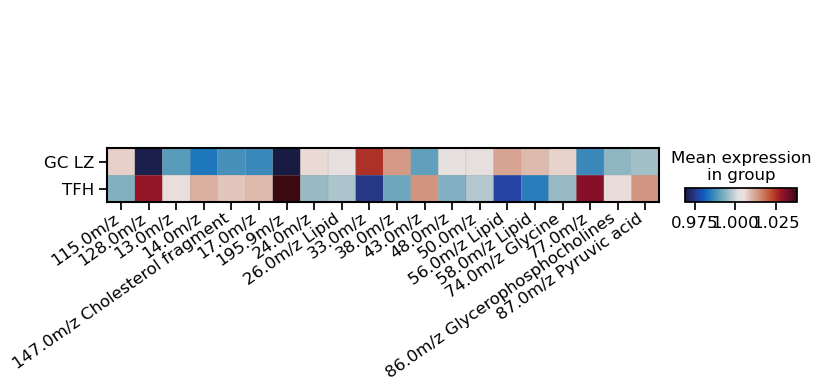

C:\Users\thu71\AppData\Local\Temp\ipykernel_34460\1820935232.py:42: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap_1 = cm.get_cmap(cmap1, 3)
C:\Users\thu71\AppData\Local\Temp\ipykernel_34460\1820935232.py:43: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap_2 = cm.get_cmap(cmap2, 3)


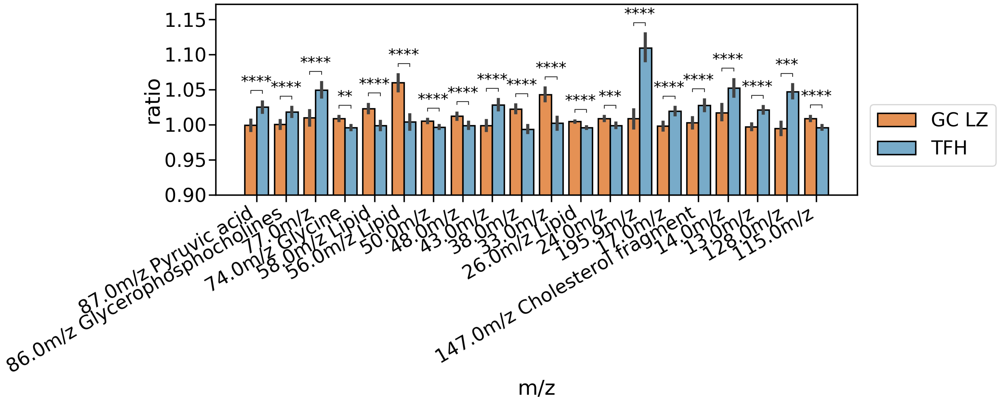

In [172]:
sc.tl.dendrogram(adata_ratio, groupby='Type')
sc.tl.rank_genes_groups(adata_ratio, groupby='Type', method='t-test_overestim_var')

# Extract diff expression dataframe
dedf = sc.get.rank_genes_groups_df(adata_ratio, group=None)

# Get top diff expression
topk=10
masses_largest = dedf.groupby('group').apply(lambda x: x.nlargest(topk,['scores'])).names.unique()
masses_lowest = dedf.groupby('group').apply(lambda x: x.nsmallest(topk,['scores'])).names.unique()
masses = np.unique(np.concatenate([masses_largest, masses_lowest]))

# Extract dataframe
var = 'Type'

adata_subset = adata_ratio[:,masses]
df_SIMS = pd.DataFrame(adata_subset.X, columns=adata_subset.var_names)
df_SIMS[var] = adata_subset.obs[var].tolist()

df_SIMS_grouped = df_SIMS.groupby([var]).median()

# Create anndata
adata_grouped = ad.AnnData(df_SIMS_grouped.values)
adata_grouped.var_names = df_SIMS_grouped.columns.tolist()
adata_grouped.obs['Type'] = df_SIMS_grouped.index.tolist()
adata_grouped.obs['Type'] = adata_grouped.obs['Type'].astype('category')

# Plot cell abundance
sc.tl.dendrogram(adata_grouped, groupby='Type')
with sns.plotting_context('notebook', font_scale=1.2):
    ax = sc.pl.matrixplot(adata_grouped, var_names=adata_grouped.var_names, groupby='Type',
                     cmap=heatmap_cmp,  show=False)
    xticklabels = ax['mainplot_ax'].get_xticklabels()
    ax['mainplot_ax'].set_xticklabels(xticklabels, rotation = 35, ha="right")
    ax['mainplot_ax'].tick_params(axis='x', pad=0)
    plt.show()
    
    
# Get colors
from matplotlib import cm

cmap_1 = cm.get_cmap(cmap1, 3)
cmap_2 = cm.get_cmap(cmap2, 3)
palette = [cmap_1(0.5), cmap_2(0.5)]


# Stack barplot
df_melt = df_SIMS.melt(id_vars='Type', var_name='m/z', value_name='ratio')

# Plot
with sns.plotting_context('poster', font_scale=1.5):
    fig, ax = plt.subplots(figsize=(20,6))
    ax = sns.barplot(data=df_melt, x='m/z', y='ratio', hue='Type', linewidth=2.5, edgecolor='k', palette=palette,
                    order=np.unique(df_melt['m/z'])[::-1])
    plt.ylim(0.9, 1.1)
    plt.xticks(rotation = 30, ha='right')
    plt.legend(bbox_to_anchor=(1.02, 0.15), loc='lower left', borderaxespad=0)

pairs = [((e,interaction[0]),(e,interaction[1])) for e in masses]
annot = Annotator(ax, pairs, data=df_melt, x='m/z', y='ratio', hue='Type',)
annot.configure(test='Mann-Whitney', text_format='star', loc='inside', verbose=0)
annot.apply_test()
ax, test_results = annot.annotate()

In [173]:
df_melt.to_clipboard()

    using 'X_pca' with n_pcs = 50
Storing dendrogram info using `.uns['dendrogram_Type']`
ranking genes
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:00)
    using data matrix X directly
Storing dendrogram info using `.uns['dendrogram_Type']`


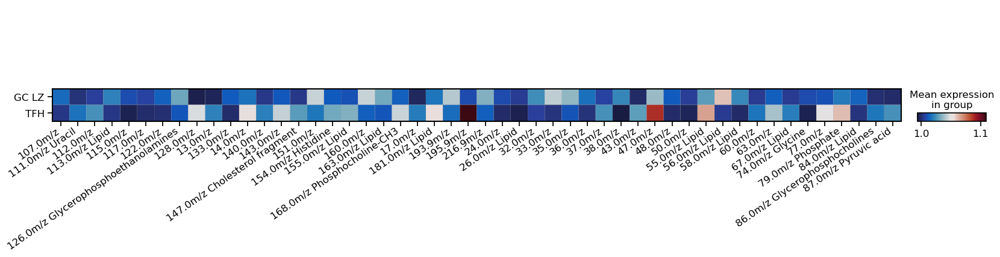

C:\Users\thu71\AppData\Local\Temp\ipykernel_34460\1027468858.py:42: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap_1 = cm.get_cmap(cmap1, 3)
C:\Users\thu71\AppData\Local\Temp\ipykernel_34460\1027468858.py:43: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap_2 = cm.get_cmap(cmap2, 3)


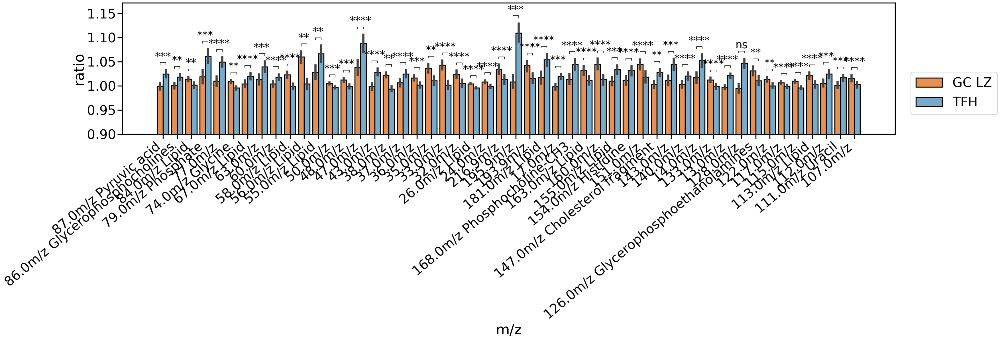

In [174]:
sc.tl.dendrogram(adata_ratio, groupby='Type')
sc.tl.rank_genes_groups(adata_ratio, groupby='Type', method='t-test_overestim_var')

# Extract diff expression dataframe
dedf = sc.get.rank_genes_groups_df(adata_ratio, group=None)

# Get top diff expression
topk=25
masses_largest = dedf.groupby('group').apply(lambda x: x.nlargest(topk,['scores'])).names.unique()
masses_lowest = dedf.groupby('group').apply(lambda x: x.nsmallest(topk,['scores'])).names.unique()
masses = np.unique(np.concatenate([masses_largest, masses_lowest]))

# Extract dataframe
var = 'Type'

adata_subset = adata_ratio[:,masses]
df_SIMS = pd.DataFrame(adata_subset.X, columns=adata_subset.var_names)
df_SIMS[var] = adata_subset.obs[var].tolist()

df_SIMS_grouped = df_SIMS.groupby([var]).mean()

# Create anndata
adata_grouped = ad.AnnData(df_SIMS_grouped.values)
adata_grouped.var_names = df_SIMS_grouped.columns.tolist()
adata_grouped.obs['Type'] = df_SIMS_grouped.index.tolist()
adata_grouped.obs['Type'] = adata_grouped.obs['Type'].astype('category')

# Plot cell abundance
sc.tl.dendrogram(adata_grouped, groupby='Type')
with sns.plotting_context('notebook', font_scale=1.2):
    ax = sc.pl.matrixplot(adata_grouped, var_names=adata_grouped.var_names, groupby='Type',
                     cmap=heatmap_cmp,  show=False)
    xticklabels = ax['mainplot_ax'].get_xticklabels()
    ax['mainplot_ax'].set_xticklabels(xticklabels, rotation = 35, ha="right")
    ax['mainplot_ax'].tick_params(axis='x', pad=0)
    plt.show()
    
    
# Get colors
from matplotlib import cm

cmap_1 = cm.get_cmap(cmap1, 3)
cmap_2 = cm.get_cmap(cmap2, 3)
palette = [cmap_1(0.5), cmap_2(0.5)]


# Stack barplot
df_melt = df_SIMS.melt(id_vars='Type', var_name='m/z', value_name='ratio')

# Plot
with sns.plotting_context('poster', font_scale=1.5):
    fig, ax = plt.subplots(figsize=(35,6))
    ax = sns.barplot(data=df_melt, x='m/z', y='ratio', hue='Type', linewidth=2.5, edgecolor='k', palette=palette,
                    order=np.unique(df_melt['m/z'])[::-1])
    plt.ylim(0.9, 1.1)
    plt.xticks(rotation = 40, ha='right')
    plt.legend(bbox_to_anchor=(1.02, 0.15), loc='lower left', borderaxespad=0)

pairs = [((e,interaction[0]),(e,interaction[1])) for e in masses]
annot = Annotator(ax, pairs, data=df_melt, x='m/z', y='ratio', hue='Type',)
annot.configure(test='Mann-Whitney', text_format='star', loc='inside', verbose=0)
annot.apply_test()
ax, test_results = annot.annotate()

In [175]:
df_SIMS.to_clipboard()

In [176]:
# import matplotlib.pyplot as plt
# import matplotlib as mpl
# plt.rcParams.update({'font.size':20})

# # Make a figure and axes with dimensions as desired.
# fig = plt.figure(figsize=(15, 5))
# ax1 = fig.add_axes([0.0, 0.15, 0.45, 0.1])
# ax2 = fig.add_axes([0.5, 0.15, 0.45, 0.1])

# norm = mpl.colors.Normalize(vmin=0.5, vmax=1.5)

# # Fist Cell type
# cb1 = mpl.colorbar.ColorbarBase(ax1, cmap=cmap1,
#                                 norm=norm, extend='both',
#                                 orientation='horizontal')
# cb1.set_label(f'{interaction[0]} ratio', fontsize=45)

# # 2nd Cell type
# cb2 = mpl.colorbar.ColorbarBase(ax2, cmap=cmap2,
#                                 norm=norm, extend='both',
#                                 orientation='horizontal')
# cb2.set_label(f'{interaction[1]} ratio', fontsize=45)
